## Testing different parameter values- simon k 

In [8]:
# Importing everthing we need 
import sys
sys.path.append('../')

from GAP.gapmodels import GAPModel
from GAP.gapmodels import Split
from GAP.gapdescriptors import distance_2b
from GAP.gapplot import QualityPlot
import matplotlib.pyplot as plt
from textwrap import wrap

In [9]:
## Import Hydrogen_MD Data and split into training and test data, use split 80%/20%
data='/Users/simon/simon_ml/GAP/hydrogen_md.xyz'
train_percentage = 0.8
split = Split(data, train_percentage)

#Perform the acutal split
train_file = 'train.xyz'
test_file = 'test.xyz'
split.split(train_file, test_file)

# Get the splitted data
train,test = split.get_splitted_data()

# Get the names of the data files containing the splitted data, just for completeness purposes. These should be 
# the same as the passed files at the split.split() method.
train_file, test_file = split.get_splitted_data_files()

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/ase/io/extxyz.py:997: UserWarning: write_xyz() overwriting array "forces" present in atoms.arrays with stored results from calculator
  warnings.warn('write_xyz() overwriting array "{0}" present '
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/ase/io/extxyz.py:997: UserWarning: write_xyz() overwriting array "energies" present in atoms.arrays with stored results from calculator
  warnings.warn('write_xyz() overwriting array "{0}" present '


## Iterate over list of configurations and perform training and fitting. Then see the quality of the fit using  gapplot.QualityPlot.

### Lists of configurations


In [14]:
cutoff = [3,4,5]
n_sparse = [10,20,30]
delta = [1]
theta_uniform = [0.1,0.01,0.001]
default_sigma = ['0.0001 0.0001 0.0 0.0','0.00001 0.00001 0.0 0.0',
                 '0.000001 0.000001 0.0 0.0','0.0000001 0.0000001 0.0 0.0']
covariance_type = ['ard_se']# , 'Gaussian', 'PP', 'BOND_REAL_SPACE'],'dot_product']
sparse_method = ['uniform','cur_points']

### Pythonic way of getting all list combinations

In [15]:
import itertools
li = [cutoff,covariance_type,delta, theta_uniform, n_sparse, sparse_method, default_sigma]
comb = list(itertools.product(*li))
print(comb)
print(len(comb))

[(3, 'ard_se', 1, 0.1, 10, 'uniform', '0.0001 0.0001 0.0 0.0'), (3, 'ard_se', 1, 0.1, 10, 'uniform', '0.00001 0.00001 0.0 0.0'), (3, 'ard_se', 1, 0.1, 10, 'uniform', '0.000001 0.000001 0.0 0.0'), (3, 'ard_se', 1, 0.1, 10, 'uniform', '0.0000001 0.0000001 0.0 0.0'), (3, 'ard_se', 1, 0.1, 10, 'cur_points', '0.0001 0.0001 0.0 0.0'), (3, 'ard_se', 1, 0.1, 10, 'cur_points', '0.00001 0.00001 0.0 0.0'), (3, 'ard_se', 1, 0.1, 10, 'cur_points', '0.000001 0.000001 0.0 0.0'), (3, 'ard_se', 1, 0.1, 10, 'cur_points', '0.0000001 0.0000001 0.0 0.0'), (3, 'ard_se', 1, 0.1, 20, 'uniform', '0.0001 0.0001 0.0 0.0'), (3, 'ard_se', 1, 0.1, 20, 'uniform', '0.00001 0.00001 0.0 0.0'), (3, 'ard_se', 1, 0.1, 20, 'uniform', '0.000001 0.000001 0.0 0.0'), (3, 'ard_se', 1, 0.1, 20, 'uniform', '0.0000001 0.0000001 0.0 0.0'), (3, 'ard_se', 1, 0.1, 20, 'cur_points', '0.0001 0.0001 0.0 0.0'), (3, 'ard_se', 1, 0.1, 20, 'cur_points', '0.00001 0.00001 0.0 0.0'), (3, 'ard_se', 1, 0.1, 20, 'cur_points', '0.000001 0.000001 0.

### Perform iteration

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP0.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   21:34:44
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 77684365
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


================================ Input parameters ==============================

atoms_filename = //MANDATORY//
at_file = train.


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP0.xml' | grep AT | sed 's/AT//'  > quip_2b_test0.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP1.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   21:35:39
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 77739178
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


==========


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP1.xml' | grep AT | sed 's/AT//'  > quip_2b_test1.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP2.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   21:36:25
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 77785973
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


========


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP2.xml' | grep AT | sed 's/AT//'  > quip_2b_test2.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP3.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   21:37:11
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 77831495
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


======


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP3.xml' | grep AT | sed 's/AT//'  > quip_2b_test3.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP4.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   21:37:56
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 77876455
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


======


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP4.xml' | grep AT | sed 's/AT//'  > quip_2b_test4.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP5.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   21:38:42
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 77922718
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


====


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP5.xml' | grep AT | sed 's/AT//'  > quip_2b_test5.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP6.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   21:39:30
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 77970260
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


==


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP6.xml' | grep AT | sed 's/AT//'  > quip_2b_test6.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP7.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   21:40:18
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 78018252
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default





 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP7.xml' | grep AT | sed 's/AT//'  > quip_2b_test7.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP8.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   21:41:04
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 78064570
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


============


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP8.xml' | grep AT | sed 's/AT//'  > quip_2b_test8.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP9.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   21:42:09
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 78129092
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


==========


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP9.xml' | grep AT | sed 's/AT//'  > quip_2b_test9.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP10.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   21:43:11
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 78191657
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=======


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP10.xml' | grep AT | sed 's/AT//'  > quip_2b_test10.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP11.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   21:44:14
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 78254723
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


===


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP11.xml' | grep AT | sed 's/AT//'  > quip_2b_test11.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP12.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   21:45:17
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 78317538
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


===


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP12.xml' | grep AT | sed 's/AT//'  > quip_2b_test12.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP13.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   21:46:17
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 78377563
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP13.xml' | grep AT | sed 's/AT//'  > quip_2b_test13.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP14.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   21:47:20
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 78440887
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default




 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP14.xml' | grep AT | sed 's/AT//'  > quip_2b_test14.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP15.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   21:48:23
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 78503846
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP15.xml' | grep AT | sed 's/AT//'  > quip_2b_test15.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP16.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 30}
libAtoms::Hello World: 08/03/2021   21:49:26
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 78566632
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=========


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP16.xml' | grep AT | sed 's/AT//'  > quip_2b_test16.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP17.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 30}
libAtoms::Hello World: 08/03/2021   21:50:47
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 78647836
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=======


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP17.xml' | grep AT | sed 's/AT//'  > quip_2b_test17.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP18.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 30}
libAtoms::Hello World: 08/03/2021   21:52:08
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 78728471
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=====


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP18.xml' | grep AT | sed 's/AT//'  > quip_2b_test18.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP19.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 30}
libAtoms::Hello World: 08/03/2021   21:53:28
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 78808444
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


===


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP19.xml' | grep AT | sed 's/AT//'  > quip_2b_test19.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP20.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 30}
libAtoms::Hello World: 08/03/2021   21:54:45
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 78885395
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


===


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP20.xml' | grep AT | sed 's/AT//'  > quip_2b_test20.xyz 



<ipython-input-16-e8c3ed32d586>:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figs, axs = plt.subplots(nrows=1,ncols=2,gridspec_kw={'wspace':1,'hspace':1})


 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP21.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 30}
libAtoms::Hello World: 08/03/2021   21:56:05
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 78965422
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


================================ Input parameters ==============================

atoms_filename = //MANDATORY//
at_file


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP21.xml' | grep AT | sed 's/AT//'  > quip_2b_test21.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP22.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 30}
libAtoms::Hello World: 08/03/2021   21:57:27
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 79047639
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default




 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP22.xml' | grep AT | sed 's/AT//'  > quip_2b_test22.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP23.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 30}
libAtoms::Hello World: 08/03/2021   21:58:49
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 79129003
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP23.xml' | grep AT | sed 's/AT//'  > quip_2b_test23.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP24.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   22:00:11
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 79211638
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=======


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP24.xml' | grep AT | sed 's/AT//'  > quip_2b_test24.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP25.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   22:00:59
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 79259223
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=====


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP25.xml' | grep AT | sed 's/AT//'  > quip_2b_test25.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP26.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   22:01:45
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 79305366
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


===


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP26.xml' | grep AT | sed 's/AT//'  > quip_2b_test26.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP27.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   22:02:30
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 79350692
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP27.xml' | grep AT | sed 's/AT//'  > quip_2b_test27.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP28.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   22:03:16
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 79396755
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP28.xml' | grep AT | sed 's/AT//'  > quip_2b_test28.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP29.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   22:04:01
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 79441535
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default




 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP29.xml' | grep AT | sed 's/AT//'  > quip_2b_test29.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP30.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   22:04:48
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 79488393
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP30.xml' | grep AT | sed 's/AT//'  > quip_2b_test30.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP31.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   22:05:34
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 79534023
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defau


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP31.xml' | grep AT | sed 's/AT//'  > quip_2b_test31.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP32.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   22:06:19
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 79579797
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=======


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP32.xml' | grep AT | sed 's/AT//'  > quip_2b_test32.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP33.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   22:07:21
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 79641802
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=====


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP33.xml' | grep AT | sed 's/AT//'  > quip_2b_test33.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP34.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   22:08:28
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 79708187
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


===


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP34.xml' | grep AT | sed 's/AT//'  > quip_2b_test34.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP35.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   22:09:31
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 79771649
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP35.xml' | grep AT | sed 's/AT//'  > quip_2b_test35.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP36.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   22:10:38
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 79838478
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP36.xml' | grep AT | sed 's/AT//'  > quip_2b_test36.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP37.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   22:11:51
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 79911668
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default




 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP37.xml' | grep AT | sed 's/AT//'  > quip_2b_test37.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP38.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   22:12:56
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 79976312
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP38.xml' | grep AT | sed 's/AT//'  > quip_2b_test38.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP39.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   22:13:57
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 80037907
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defau


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP39.xml' | grep AT | sed 's/AT//'  > quip_2b_test39.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP40.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 30}
libAtoms::Hello World: 08/03/2021   22:15:01
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 80101774
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=======


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP40.xml' | grep AT | sed 's/AT//'  > quip_2b_test40.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP41.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 30}
libAtoms::Hello World: 08/03/2021   22:16:22
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 80182807
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=====


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP41.xml' | grep AT | sed 's/AT//'  > quip_2b_test41.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP42.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 30}
libAtoms::Hello World: 08/03/2021   22:17:40
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 80260933
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


===


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP42.xml' | grep AT | sed 's/AT//'  > quip_2b_test42.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP43.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 30}
libAtoms::Hello World: 08/03/2021   22:18:57
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 80337722
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP43.xml' | grep AT | sed 's/AT//'  > quip_2b_test43.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP44.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 30}
libAtoms::Hello World: 08/03/2021   22:20:13
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 80413604
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP44.xml' | grep AT | sed 's/AT//'  > quip_2b_test44.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP45.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 30}
libAtoms::Hello World: 08/03/2021   22:21:31
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 80491346
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default




 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP45.xml' | grep AT | sed 's/AT//'  > quip_2b_test45.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP46.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 30}
libAtoms::Hello World: 08/03/2021   22:22:46
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 80566162
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP46.xml' | grep AT | sed 's/AT//'  > quip_2b_test46.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP47.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 30}
libAtoms::Hello World: 08/03/2021   22:24:02
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 80642183
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defau


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP47.xml' | grep AT | sed 's/AT//'  > quip_2b_test47.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP48.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   22:25:17
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 80717791
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=====


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP48.xml' | grep AT | sed 's/AT//'  > quip_2b_test48.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP49.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   22:26:01
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 80761307
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


===


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP49.xml' | grep AT | sed 's/AT//'  > quip_2b_test49.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP50.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   22:26:44
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 80804394
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP50.xml' | grep AT | sed 's/AT//'  > quip_2b_test50.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP51.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   22:27:28
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 80848616
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default




 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP51.xml' | grep AT | sed 's/AT//'  > quip_2b_test51.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP52.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   22:28:10
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 80890564
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default




 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP52.xml' | grep AT | sed 's/AT//'  > quip_2b_test52.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP53.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   22:29:01
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 80941885
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP53.xml' | grep AT | sed 's/AT//'  > quip_2b_test53.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP54.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   22:48:34
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 82114377
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defau


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP54.xml' | grep AT | sed 's/AT//'  > quip_2b_test54.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP55.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   22:49:18
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 82158627
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by def


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP55.xml' | grep AT | sed 's/AT//'  > quip_2b_test55.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP56.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   22:50:04
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 82205000
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=====


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP56.xml' | grep AT | sed 's/AT//'  > quip_2b_test56.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP57.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   22:51:09
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 82269410
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


===


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP57.xml' | grep AT | sed 's/AT//'  > quip_2b_test57.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP58.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   22:52:13
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 82333385
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP58.xml' | grep AT | sed 's/AT//'  > quip_2b_test58.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP59.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   22:53:26
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 82406054
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default




 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP59.xml' | grep AT | sed 's/AT//'  > quip_2b_test59.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP60.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   22:54:34
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 82474655
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default




 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP60.xml' | grep AT | sed 's/AT//'  > quip_2b_test60.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP61.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   22:55:42
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 82542275
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP61.xml' | grep AT | sed 's/AT//'  > quip_2b_test61.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP62.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   22:56:49
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 82609586
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defau


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP62.xml' | grep AT | sed 's/AT//'  > quip_2b_test62.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP63.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   22:57:55
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 82675179
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by def


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP63.xml' | grep AT | sed 's/AT//'  > quip_2b_test63.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP64.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 30}
libAtoms::Hello World: 08/03/2021   22:59:00
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 82740632
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=====


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP64.xml' | grep AT | sed 's/AT//'  > quip_2b_test64.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP65.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 30}
libAtoms::Hello World: 08/03/2021   23:00:24
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 82824240
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


===


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP65.xml' | grep AT | sed 's/AT//'  > quip_2b_test65.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP66.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 30}
libAtoms::Hello World: 08/03/2021   23:01:49
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 82909322
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP66.xml' | grep AT | sed 's/AT//'  > quip_2b_test66.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP67.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 30}
libAtoms::Hello World: 08/03/2021   23:03:16
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 82996399
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default




 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP67.xml' | grep AT | sed 's/AT//'  > quip_2b_test67.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP68.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 30}
libAtoms::Hello World: 08/03/2021   23:04:42
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 83082556
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default




 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP68.xml' | grep AT | sed 's/AT//'  > quip_2b_test68.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP69.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 30}
libAtoms::Hello World: 08/03/2021   23:06:03
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 83163957
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP69.xml' | grep AT | sed 's/AT//'  > quip_2b_test69.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP70.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 30}
libAtoms::Hello World: 08/03/2021   23:07:26
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 83246127
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defau


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP70.xml' | grep AT | sed 's/AT//'  > quip_2b_test70.xyz 

 distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP71.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 3 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 30}
libAtoms::Hello World: 08/03/2021   23:08:52
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 83332291
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by def


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP71.xml' | grep AT | sed 's/AT//'  > quip_2b_test71.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP72.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   23:10:16
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 83416919
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=========


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP72.xml' | grep AT | sed 's/AT//'  > quip_2b_test72.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP73.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   23:11:06
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 83466518
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=======


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP73.xml' | grep AT | sed 's/AT//'  > quip_2b_test73.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP74.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   23:11:54
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 83514127
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=====


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP74.xml' | grep AT | sed 's/AT//'  > quip_2b_test74.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP75.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   23:12:42
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 83562748
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


===


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP75.xml' | grep AT | sed 's/AT//'  > quip_2b_test75.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP76.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   23:13:32
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 83612121
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


===


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP76.xml' | grep AT | sed 's/AT//'  > quip_2b_test76.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP77.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   23:14:21
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 83661423
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP77.xml' | grep AT | sed 's/AT//'  > quip_2b_test77.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP78.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   23:15:10
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 83710829
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default




 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP78.xml' | grep AT | sed 's/AT//'  > quip_2b_test78.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP79.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   23:15:59
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 83759065
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP79.xml' | grep AT | sed 's/AT//'  > quip_2b_test79.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP80.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   23:16:48
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 83808293
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=========


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP80.xml' | grep AT | sed 's/AT//'  > quip_2b_test80.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP81.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   23:17:53
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 83873997
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=======


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP81.xml' | grep AT | sed 's/AT//'  > quip_2b_test81.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP82.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   23:19:02
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 83942023
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=====


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP82.xml' | grep AT | sed 's/AT//'  > quip_2b_test82.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP83.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   23:20:07
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 84007467
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


===


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP83.xml' | grep AT | sed 's/AT//'  > quip_2b_test83.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP84.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   23:21:13
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 84073345
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


===


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP84.xml' | grep AT | sed 's/AT//'  > quip_2b_test84.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP85.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   23:22:20
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 84140800
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP85.xml' | grep AT | sed 's/AT//'  > quip_2b_test85.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP86.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   23:23:27
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 84207893
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default




 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP86.xml' | grep AT | sed 's/AT//'  > quip_2b_test86.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP87.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   23:24:34
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 84274786
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP87.xml' | grep AT | sed 's/AT//'  > quip_2b_test87.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP88.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 30}
libAtoms::Hello World: 08/03/2021   23:25:41
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 84341184
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=========


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP88.xml' | grep AT | sed 's/AT//'  > quip_2b_test88.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP89.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 30}
libAtoms::Hello World: 08/03/2021   23:27:08
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 84428754
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=======


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP89.xml' | grep AT | sed 's/AT//'  > quip_2b_test89.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP90.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 30}
libAtoms::Hello World: 08/03/2021   23:28:38
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 84518240
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=====


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP90.xml' | grep AT | sed 's/AT//'  > quip_2b_test90.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP91.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 30}
libAtoms::Hello World: 08/03/2021   23:30:06
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 84606597
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


===


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP91.xml' | grep AT | sed 's/AT//'  > quip_2b_test91.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP92.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 30}
libAtoms::Hello World: 08/03/2021   23:31:33
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 84693267
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


===


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP92.xml' | grep AT | sed 's/AT//'  > quip_2b_test92.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP93.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 30}
libAtoms::Hello World: 08/03/2021   23:32:57
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 84777204
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP93.xml' | grep AT | sed 's/AT//'  > quip_2b_test93.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP94.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 30}
libAtoms::Hello World: 08/03/2021   23:34:15
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 84855278
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default




 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP94.xml' | grep AT | sed 's/AT//'  > quip_2b_test94.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP95.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 30}
libAtoms::Hello World: 08/03/2021   23:35:31
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 84931241
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP95.xml' | grep AT | sed 's/AT//'  > quip_2b_test95.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP96.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   23:36:49
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 85009525
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=======


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP96.xml' | grep AT | sed 's/AT//'  > quip_2b_test96.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP97.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   23:37:34
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 85054049
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=====


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP97.xml' | grep AT | sed 's/AT//'  > quip_2b_test97.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP98.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   23:38:18
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 85098765
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


===


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP98.xml' | grep AT | sed 's/AT//'  > quip_2b_test98.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP99.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   23:39:03
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 85143833
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP99.xml' | grep AT | sed 's/AT//'  > quip_2b_test99.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP100.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   23:39:48
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 85188586
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default





 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP100.xml' | grep AT | sed 's/AT//'  > quip_2b_test100.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP101.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   23:40:33
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 85233285
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defaul


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP101.xml' | grep AT | sed 's/AT//'  > quip_2b_test101.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP102.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   23:41:18
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 85278563
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defa


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP102.xml' | grep AT | sed 's/AT//'  > quip_2b_test102.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP103.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 10}
libAtoms::Hello World: 08/03/2021   23:42:03
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 85323424
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by de


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP103.xml' | grep AT | sed 's/AT//'  > quip_2b_test103.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP104.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   23:42:48
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 85368561
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


====


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP104.xml' | grep AT | sed 's/AT//'  > quip_2b_test104.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP105.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   23:43:50
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 85430069
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


==


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP105.xml' | grep AT | sed 's/AT//'  > quip_2b_test105.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP106.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   23:44:57
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 85497461
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default





 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP106.xml' | grep AT | sed 's/AT//'  > quip_2b_test106.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP107.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   23:45:59
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 85559299
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default



 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP107.xml' | grep AT | sed 's/AT//'  > quip_2b_test107.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP108.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   23:47:00
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 85620262
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default



 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP108.xml' | grep AT | sed 's/AT//'  > quip_2b_test108.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP109.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   23:48:01
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 85681315
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defaul


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP109.xml' | grep AT | sed 's/AT//'  > quip_2b_test109.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP110.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   23:49:02
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 85742530
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defa


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP110.xml' | grep AT | sed 's/AT//'  > quip_2b_test110.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP111.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 20}
libAtoms::Hello World: 08/03/2021   23:50:04
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 85804465
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by de


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP111.xml' | grep AT | sed 's/AT//'  > quip_2b_test111.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP112.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 30}
libAtoms::Hello World: 08/03/2021   23:51:06
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 85866312
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


====


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP112.xml' | grep AT | sed 's/AT//'  > quip_2b_test112.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP113.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 30}
libAtoms::Hello World: 08/03/2021   23:52:22
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 85942624
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


==


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP113.xml' | grep AT | sed 's/AT//'  > quip_2b_test113.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP114.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 30}
libAtoms::Hello World: 08/03/2021   23:53:40
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 86020604
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default





 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP114.xml' | grep AT | sed 's/AT//'  > quip_2b_test114.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP115.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 30}
libAtoms::Hello World: 08/03/2021   23:54:58
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 86098150
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default



 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP115.xml' | grep AT | sed 's/AT//'  > quip_2b_test115.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP116.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 30}
libAtoms::Hello World: 09/03/2021   00:01:23
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 83641
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP116.xml' | grep AT | sed 's/AT//'  > quip_2b_test116.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP117.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 30}
libAtoms::Hello World: 09/03/2021   00:26:25
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 1585023
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP117.xml' | grep AT | sed 's/AT//'  > quip_2b_test117.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP118.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 30}
libAtoms::Hello World: 09/03/2021   00:27:43
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 1663484
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defau


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP118.xml' | grep AT | sed 's/AT//'  > quip_2b_test118.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP119.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 30}
libAtoms::Hello World: 09/03/2021   00:29:04
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 1744919
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by def


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP119.xml' | grep AT | sed 's/AT//'  > quip_2b_test119.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP120.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 10}
libAtoms::Hello World: 09/03/2021   01:10:39
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 4239965
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


===


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP120.xml' | grep AT | sed 's/AT//'  > quip_2b_test120.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP121.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 10}
libAtoms::Hello World: 09/03/2021   01:11:34
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 4294606
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


=


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP121.xml' | grep AT | sed 's/AT//'  > quip_2b_test121.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP122.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 10}
libAtoms::Hello World: 09/03/2021   01:12:18
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 4338127
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default




 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP122.xml' | grep AT | sed 's/AT//'  > quip_2b_test122.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP123.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 10}
libAtoms::Hello World: 09/03/2021   01:13:02
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 4382201
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP123.xml' | grep AT | sed 's/AT//'  > quip_2b_test123.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP124.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 10}
libAtoms::Hello World: 09/03/2021   01:13:46
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 4426088
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP124.xml' | grep AT | sed 's/AT//'  > quip_2b_test124.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP125.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 10}
libAtoms::Hello World: 09/03/2021   01:14:30
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 4470709
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defau


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP125.xml' | grep AT | sed 's/AT//'  > quip_2b_test125.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP126.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 10}
libAtoms::Hello World: 09/03/2021   01:15:14
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 4514827
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by def


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP126.xml' | grep AT | sed 's/AT//'  > quip_2b_test126.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP127.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 10}
libAtoms::Hello World: 09/03/2021   03:16:07
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 11767176
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by 


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP127.xml' | grep AT | sed 's/AT//'  > quip_2b_test127.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP128.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 20}
libAtoms::Hello World: 09/03/2021   03:16:54
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 11814649
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


==


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP128.xml' | grep AT | sed 's/AT//'  > quip_2b_test128.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP129.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 20}
libAtoms::Hello World: 09/03/2021   03:17:56
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 11876006
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default





 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP129.xml' | grep AT | sed 's/AT//'  > quip_2b_test129.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP130.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 20}
libAtoms::Hello World: 09/03/2021   03:18:57
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 11937281
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default



 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP130.xml' | grep AT | sed 's/AT//'  > quip_2b_test130.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP131.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 20}
libAtoms::Hello World: 09/03/2021   03:19:59
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 11999239
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defaul


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP131.xml' | grep AT | sed 's/AT//'  > quip_2b_test131.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP132.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 20}
libAtoms::Hello World: 09/03/2021   05:20:57
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 19257502
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defaul


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP132.xml' | grep AT | sed 's/AT//'  > quip_2b_test132.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP133.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 20}
libAtoms::Hello World: 09/03/2021   05:22:08
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 19328282
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defa


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP133.xml' | grep AT | sed 's/AT//'  > quip_2b_test133.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP134.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 20}
libAtoms::Hello World: 09/03/2021   05:23:08
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 19388884
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by de


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP134.xml' | grep AT | sed 's/AT//'  > quip_2b_test134.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP135.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 20}
libAtoms::Hello World: 09/03/2021   05:24:10
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 19450228
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by 


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP135.xml' | grep AT | sed 's/AT//'  > quip_2b_test135.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP136.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 30}
libAtoms::Hello World: 09/03/2021   05:25:12
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 19512634
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


==


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP136.xml' | grep AT | sed 's/AT//'  > quip_2b_test136.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP137.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 30}
libAtoms::Hello World: 09/03/2021   05:26:30
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 19590177
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default





 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP137.xml' | grep AT | sed 's/AT//'  > quip_2b_test137.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP138.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 30}
libAtoms::Hello World: 09/03/2021   05:27:48
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 19668139
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default



 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP138.xml' | grep AT | sed 's/AT//'  > quip_2b_test138.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP139.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 30}
libAtoms::Hello World: 09/03/2021   05:29:04
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 19744656
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defaul


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP139.xml' | grep AT | sed 's/AT//'  > quip_2b_test139.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP140.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 30}
libAtoms::Hello World: 09/03/2021   05:30:23
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 19823501
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defaul


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP140.xml' | grep AT | sed 's/AT//'  > quip_2b_test140.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP141.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 30}
libAtoms::Hello World: 09/03/2021   05:31:46
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 19906295
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defa


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP141.xml' | grep AT | sed 's/AT//'  > quip_2b_test141.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP142.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 30}
libAtoms::Hello World: 09/03/2021   05:33:06
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 19986565
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by de


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP142.xml' | grep AT | sed 's/AT//'  > quip_2b_test142.xyz 

 distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP143.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 4 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 30}
libAtoms::Hello World: 09/03/2021   05:34:28
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 20068081
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by 


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP143.xml' | grep AT | sed 's/AT//'  > quip_2b_test143.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP144.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 10}
libAtoms::Hello World: 09/03/2021   05:35:49
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 20149908
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


======


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP144.xml' | grep AT | sed 's/AT//'  > quip_2b_test144.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP145.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 10}
libAtoms::Hello World: 09/03/2021   05:36:38
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 20198732
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


====


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP145.xml' | grep AT | sed 's/AT//'  > quip_2b_test145.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP146.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 10}
libAtoms::Hello World: 09/03/2021   05:37:26
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 20246736
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


==


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP146.xml' | grep AT | sed 's/AT//'  > quip_2b_test146.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP147.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 10}
libAtoms::Hello World: 09/03/2021   05:38:13
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 20293434
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default





 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP147.xml' | grep AT | sed 's/AT//'  > quip_2b_test147.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP148.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 10}
libAtoms::Hello World: 09/03/2021   05:39:01
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 20341791
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default





 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP148.xml' | grep AT | sed 's/AT//'  > quip_2b_test148.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP149.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 10}
libAtoms::Hello World: 09/03/2021   05:39:49
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 20389728
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default



 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP149.xml' | grep AT | sed 's/AT//'  > quip_2b_test149.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP150.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 10}
libAtoms::Hello World: 09/03/2021   05:40:37
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 20437652
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defaul


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP150.xml' | grep AT | sed 's/AT//'  > quip_2b_test150.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP151.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 10}
libAtoms::Hello World: 09/03/2021   05:41:27
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 20487832
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defa


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP151.xml' | grep AT | sed 's/AT//'  > quip_2b_test151.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP152.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 20}
libAtoms::Hello World: 09/03/2021   05:42:15
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 20535730
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


======


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP152.xml' | grep AT | sed 's/AT//'  > quip_2b_test152.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP153.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 20}
libAtoms::Hello World: 09/03/2021   05:43:20
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 20600868
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


====


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP153.xml' | grep AT | sed 's/AT//'  > quip_2b_test153.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP154.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 20}
libAtoms::Hello World: 09/03/2021   05:44:26
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 20666398
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


==


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP154.xml' | grep AT | sed 's/AT//'  > quip_2b_test154.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP155.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 20}
libAtoms::Hello World: 09/03/2021   05:45:34
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 20734631
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default





 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP155.xml' | grep AT | sed 's/AT//'  > quip_2b_test155.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP156.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 20}
libAtoms::Hello World: 09/03/2021   05:46:41
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 20801374
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default





 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP156.xml' | grep AT | sed 's/AT//'  > quip_2b_test156.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP157.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 20}
libAtoms::Hello World: 09/03/2021   05:47:47
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 20867257
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default



 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP157.xml' | grep AT | sed 's/AT//'  > quip_2b_test157.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP158.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 20}
libAtoms::Hello World: 09/03/2021   05:48:52
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 20932678
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defaul


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP158.xml' | grep AT | sed 's/AT//'  > quip_2b_test158.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP159.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 20}
libAtoms::Hello World: 09/03/2021   05:49:58
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 20998758
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defa


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP159.xml' | grep AT | sed 's/AT//'  > quip_2b_test159.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP160.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 30}
libAtoms::Hello World: 09/03/2021   05:51:04
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 21064507
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


======


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP160.xml' | grep AT | sed 's/AT//'  > quip_2b_test160.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP161.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 30}
libAtoms::Hello World: 09/03/2021   05:52:29
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 21149331
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


====


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP161.xml' | grep AT | sed 's/AT//'  > quip_2b_test161.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP162.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 30}
libAtoms::Hello World: 09/03/2021   05:53:50
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 21230519
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


==


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP162.xml' | grep AT | sed 's/AT//'  > quip_2b_test162.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP163.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = uniform add_species = T n_sparse = 30}
libAtoms::Hello World: 09/03/2021   05:55:14
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 21314317
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default





 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP163.xml' | grep AT | sed 's/AT//'  > quip_2b_test163.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP164.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 30}
libAtoms::Hello World: 09/03/2021   05:56:38
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 21398911
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default





 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP164.xml' | grep AT | sed 's/AT//'  > quip_2b_test164.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP165.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 30}
libAtoms::Hello World: 09/03/2021   05:58:03
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 21483657
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default



 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP165.xml' | grep AT | sed 's/AT//'  > quip_2b_test165.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP166.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 30}
libAtoms::Hello World: 09/03/2021   05:59:29
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 21569783
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defaul


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP166.xml' | grep AT | sed 's/AT//'  > quip_2b_test166.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP167.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.1 sparse_method = cur_points add_species = T n_sparse = 30}
libAtoms::Hello World: 09/03/2021   06:00:55
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 21655058
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defa


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP167.xml' | grep AT | sed 's/AT//'  > quip_2b_test167.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP168.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 10}
libAtoms::Hello World: 09/03/2021   06:02:21
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 21741709
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


====


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP168.xml' | grep AT | sed 's/AT//'  > quip_2b_test168.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP169.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 10}
libAtoms::Hello World: 09/03/2021   06:03:11
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 21791816
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


==


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP169.xml' | grep AT | sed 's/AT//'  > quip_2b_test169.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP170.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 10}
libAtoms::Hello World: 09/03/2021   06:04:01
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 21841806
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default





 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP170.xml' | grep AT | sed 's/AT//'  > quip_2b_test170.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP171.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 10}
libAtoms::Hello World: 09/03/2021   06:04:50
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 21890407
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default



 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP171.xml' | grep AT | sed 's/AT//'  > quip_2b_test171.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP172.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 10}
libAtoms::Hello World: 09/03/2021   06:05:40
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 21940801
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default



 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP172.xml' | grep AT | sed 's/AT//'  > quip_2b_test172.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP173.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 10}
libAtoms::Hello World: 09/03/2021   06:06:31
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 21991977
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defaul


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP173.xml' | grep AT | sed 's/AT//'  > quip_2b_test173.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP174.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 10}
libAtoms::Hello World: 09/03/2021   06:07:21
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 22041556
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defa


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP174.xml' | grep AT | sed 's/AT//'  > quip_2b_test174.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP175.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 10}
libAtoms::Hello World: 09/03/2021   08:08:20
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 29300317
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by de


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP175.xml' | grep AT | sed 's/AT//'  > quip_2b_test175.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP176.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 20}
libAtoms::Hello World: 09/03/2021   08:09:08
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 29348543
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


====


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP176.xml' | grep AT | sed 's/AT//'  > quip_2b_test176.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP177.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 20}
libAtoms::Hello World: 09/03/2021   08:10:12
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 29412486
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


==


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP177.xml' | grep AT | sed 's/AT//'  > quip_2b_test177.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP178.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 20}
libAtoms::Hello World: 09/03/2021   08:37:15
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 31035899
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default





 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP178.xml' | grep AT | sed 's/AT//'  > quip_2b_test178.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP179.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 20}
libAtoms::Hello World: 09/03/2021   08:38:19
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 31099708
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default



 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP179.xml' | grep AT | sed 's/AT//'  > quip_2b_test179.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP180.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 20}
libAtoms::Hello World: 09/03/2021   08:39:25
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 31165512
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default



 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP180.xml' | grep AT | sed 's/AT//'  > quip_2b_test180.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP181.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 20}
libAtoms::Hello World: 09/03/2021   08:40:32
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 31232062
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defaul


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP181.xml' | grep AT | sed 's/AT//'  > quip_2b_test181.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP182.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 20}
libAtoms::Hello World: 09/03/2021   08:41:38
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 31298284
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defa


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP182.xml' | grep AT | sed 's/AT//'  > quip_2b_test182.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP183.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 20}
libAtoms::Hello World: 09/03/2021   08:42:44
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 31364908
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by de


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP183.xml' | grep AT | sed 's/AT//'  > quip_2b_test183.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP184.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 30}
libAtoms::Hello World: 09/03/2021   08:43:51
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 31431976
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


====


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP184.xml' | grep AT | sed 's/AT//'  > quip_2b_test184.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP185.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 30}
libAtoms::Hello World: 09/03/2021   08:45:19
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 31519103
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


==


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP185.xml' | grep AT | sed 's/AT//'  > quip_2b_test185.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP186.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 30}
libAtoms::Hello World: 09/03/2021   08:46:46
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 31606307
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default





 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP186.xml' | grep AT | sed 's/AT//'  > quip_2b_test186.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP187.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = uniform add_species = T n_sparse = 30}
libAtoms::Hello World: 09/03/2021   08:48:10
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 31690964
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default



 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP187.xml' | grep AT | sed 's/AT//'  > quip_2b_test187.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP188.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 30}
libAtoms::Hello World: 09/03/2021   08:49:35
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 31775643
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default



 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP188.xml' | grep AT | sed 's/AT//'  > quip_2b_test188.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP189.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 30}
libAtoms::Hello World: 09/03/2021   08:51:02
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 31862085
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defaul


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP189.xml' | grep AT | sed 's/AT//'  > quip_2b_test189.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP190.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 30}
libAtoms::Hello World: 09/03/2021   08:52:22
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 31942420
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defa


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP190.xml' | grep AT | sed 's/AT//'  > quip_2b_test190.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP191.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.01 sparse_method = cur_points add_species = T n_sparse = 30}
libAtoms::Hello World: 09/03/2021   08:53:41
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 32021119
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by de


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP191.xml' | grep AT | sed 's/AT//'  > quip_2b_test191.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP192.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 10}
libAtoms::Hello World: 09/03/2021   08:54:58
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 32098540
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


==


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP192.xml' | grep AT | sed 's/AT//'  > quip_2b_test192.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP193.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 10}
libAtoms::Hello World: 09/03/2021   08:55:42
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 32142522
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default





 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP193.xml' | grep AT | sed 's/AT//'  > quip_2b_test193.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP194.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 10}
libAtoms::Hello World: 09/03/2021   08:56:26
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 32186096
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default



 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP194.xml' | grep AT | sed 's/AT//'  > quip_2b_test194.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP195.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 10}
libAtoms::Hello World: 09/03/2021   08:57:10
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 32230327
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defaul


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP195.xml' | grep AT | sed 's/AT//'  > quip_2b_test195.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP196.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 10}
libAtoms::Hello World: 09/03/2021   08:57:54
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 32274142
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defaul


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP196.xml' | grep AT | sed 's/AT//'  > quip_2b_test196.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP197.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 10}
libAtoms::Hello World: 09/03/2021   08:58:38
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 32318375
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defa


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP197.xml' | grep AT | sed 's/AT//'  > quip_2b_test197.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP198.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 10}
libAtoms::Hello World: 09/03/2021   08:59:23
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 32363406
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by de


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP198.xml' | grep AT | sed 's/AT//'  > quip_2b_test198.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 10
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP199.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 10}
libAtoms::Hello World: 09/03/2021   09:00:08
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 32408693
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by 


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP199.xml' | grep AT | sed 's/AT//'  > quip_2b_test199.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP200.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 20}
libAtoms::Hello World: 09/03/2021   09:00:53
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 32453016
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


==


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP200.xml' | grep AT | sed 's/AT//'  > quip_2b_test200.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP201.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 20}
libAtoms::Hello World: 09/03/2021   09:01:53
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 32513531
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default





 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP201.xml' | grep AT | sed 's/AT//'  > quip_2b_test201.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP202.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 20}
libAtoms::Hello World: 09/03/2021   09:16:04
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 33364432
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default



 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP202.xml' | grep AT | sed 's/AT//'  > quip_2b_test202.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP203.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 20}
libAtoms::Hello World: 09/03/2021   09:17:16
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 33436583
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defaul


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP203.xml' | grep AT | sed 's/AT//'  > quip_2b_test203.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP204.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 20}
libAtoms::Hello World: 09/03/2021   09:18:26
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 33506156
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defaul


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP204.xml' | grep AT | sed 's/AT//'  > quip_2b_test204.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP205.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 20}
libAtoms::Hello World: 09/03/2021   09:19:31
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 33571903
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defa


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP205.xml' | grep AT | sed 's/AT//'  > quip_2b_test205.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP206.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 20}
libAtoms::Hello World: 09/03/2021   09:20:36
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 33636412
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by de


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP206.xml' | grep AT | sed 's/AT//'  > quip_2b_test206.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 20
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP207.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 20}
libAtoms::Hello World: 09/03/2021   09:21:40
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 33700287
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by 


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP207.xml' | grep AT | sed 's/AT//'  > quip_2b_test207.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP208.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 30}
libAtoms::Hello World: 09/03/2021   09:22:44
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 33764277
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default


==


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP208.xml' | grep AT | sed 's/AT//'  > quip_2b_test208.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP209.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 30}
libAtoms::Hello World: 09/03/2021   09:24:05
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 33845581
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default





 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP209.xml' | grep AT | sed 's/AT//'  > quip_2b_test209.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP210.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 30}
libAtoms::Hello World: 09/03/2021   09:25:26
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 33926538
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by default



 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP210.xml' | grep AT | sed 's/AT//'  > quip_2b_test210.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP211.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = uniform add_species = T n_sparse = 30}
libAtoms::Hello World: 09/03/2021   09:26:47
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 34007819
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defaul


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP211.xml' | grep AT | sed 's/AT//'  > quip_2b_test211.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP212.xml at_file = 'train.xyz'  default_sigma = { 0.0001 0.0001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 30}
libAtoms::Hello World: 09/03/2021   09:28:08
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 34088778
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defaul


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP212.xml' | grep AT | sed 's/AT//'  > quip_2b_test212.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP213.xml at_file = 'train.xyz'  default_sigma = { 0.00001 0.00001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 30}
libAtoms::Hello World: 09/03/2021   09:29:30
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 34170736
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by defa


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP213.xml' | grep AT | sed 's/AT//'  > quip_2b_test213.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP214.xml at_file = 'train.xyz'  default_sigma = { 0.000001 0.000001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 30}
libAtoms::Hello World: 09/03/2021   09:30:51
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 34251730
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by de


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP214.xml' | grep AT | sed 's/AT//'  > quip_2b_test214.xyz 

 distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 30
 gap_fit energy_parameter_name = energy  force_parameter_name = forces do_copy_at_file = F  sparse_separate_file = T gp_file = GAP215.xml at_file = 'train.xyz'  default_sigma = { 0.0000001 0.0000001 0.0 0.0 } gap = {  distance_2b cutoff = 5 covariance_type = ard_se delta = 1 theta_uniform = 0.001 sparse_method = cur_points add_species = T n_sparse = 30}
libAtoms::Hello World: 09/03/2021   09:32:13
libAtoms::Hello World: git version  https://github.com/libAtoms/QUIP.git,357e28d15-dirty
libAtoms::Hello World: QUIP_ARCH    darwin_x86_64_gfortran
libAtoms::Hello World: compiled on  Jan 15 2021 at 14:52:24
libAtoms::Hello World: Random Seed = 34333386
libAtoms::Hello World: global verbosity = 0

Calls to system_timer will do nothing by 


 quip E=T F=T  atoms_filename='test.xyz'  param_filename='GAP215.xml' | grep AT | sed 's/AT//'  > quip_2b_test215.xyz 



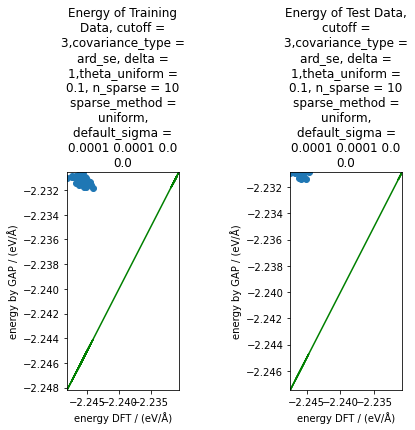

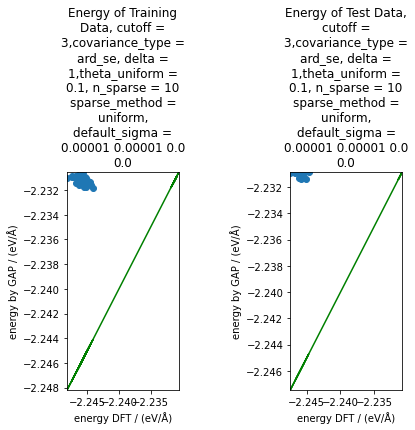

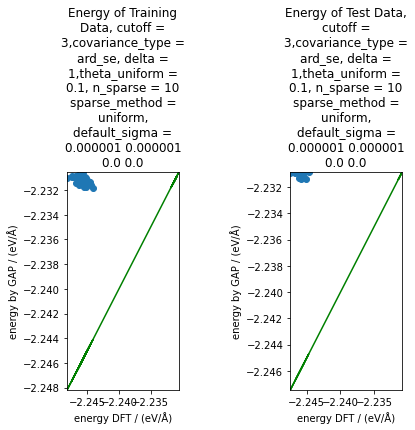

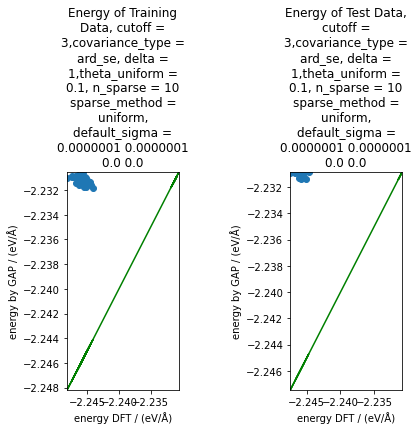

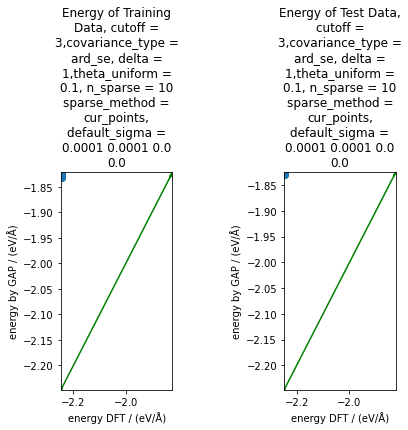

...

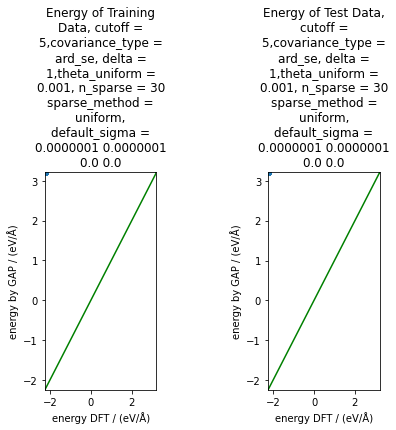

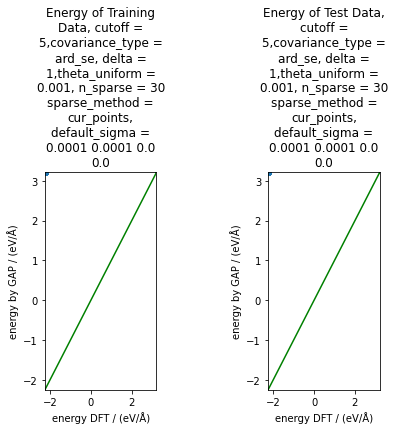

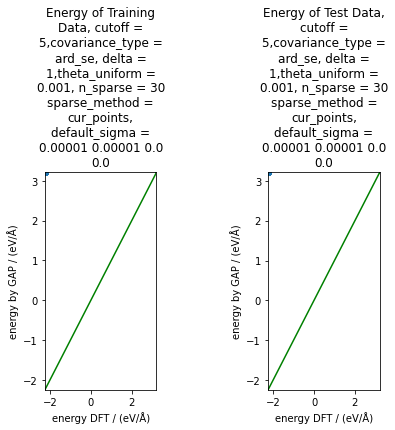

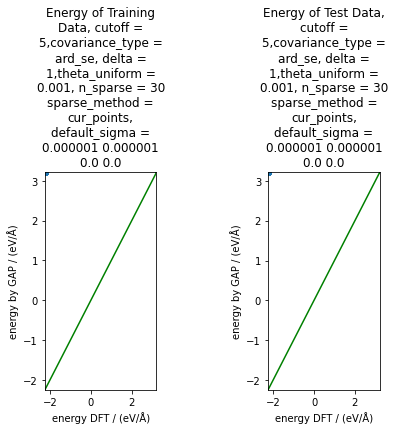

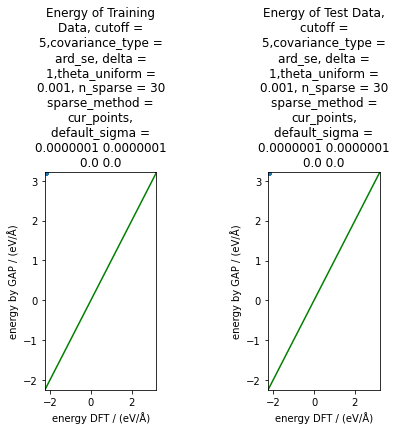

In [16]:
for i,(cut,cov,delta,theta,nsparse,sparse,sigma) in enumerate(comb):
    descriptor_2b = distance_2b(cutoff=cut, covariance_type=cov,delta=delta,theta_uniform=theta,
                                n_sparse=nsparse, sparse_method=sparse,add_species='T')
    # Make model
    model = GAPModel()
    
    # Select filename in which potential should be stored 
    potential=f"GAP{i}.xml"
    
    # Get descriptor parameter string
    parameters = descriptor_2b.get_parameter_string()
    # Train model
    model.train(parameters, training_data=train_file,GAP_potential=potential,sigma=sigma,print_output=True)
    
    # Select filename in which predictions should be stored for train data 
    prediction_train = f"quip_2b_train{i}.xyz"

    # Predict energies on training data
    model.predict(Test_Data=train_file, GAP_potential=potential, QUIP_Prediction=prediction_train,print_output=True)
    
    # Select filename in which predictions should be stored for test data 
    prediction_test = f"quip_2b_test{i}.xyz"

    # Predict energies on test data
    model.predict(Test_Data=test_file, GAP_potential=potential, QUIP_Prediction=prediction_test)
    
    # Plot ennergies to see quality of the fit
    plot = QualityPlot()
    
    # Make subplots object, returning axis object which is going to be passed to QualityPlot
    figs, axs = plt.subplots(nrows=1,ncols=2,gridspec_kw={'wspace':1,'hspace':1})
    
    # Plot predicted energies of training data against real energies of training data
    plot.energies_on_energies(real_values=train_file, predicted_values=prediction_train, 
                            axis=axs[0],
                            title="\n".join(wrap(f"Energy of Training Data, cutoff = {cut},"
                            f"covariance_type = {cov}, delta = {delta},"
                            f"theta_uniform = {theta}, n_sparse = {nsparse} "
                            f"sparse_method = {sparse}, default_sigma = {sigma}",20)))
    
    # Plot predicted energies of test data against real energies of test data
    plot.energies_on_energies(real_values=test_file, predicted_values=prediction_test, 
                            axis=axs[1], 
                            title="\n".join(wrap(f"Energy of Test Data, cutoff = {cut},"
                            f"covariance_type = {cov}, delta = {delta},"
                            f"theta_uniform = {theta}, n_sparse = {nsparse} "
                            f"sparse_method = {sparse}, default_sigma = {sigma}",20)))
    
    
   
    
    

<ipython-input-17-e4f67691751b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figs, axs = plt.subplots(nrows=1,ncols=2,gridspec_kw={'wspace':1,'hspace':1})


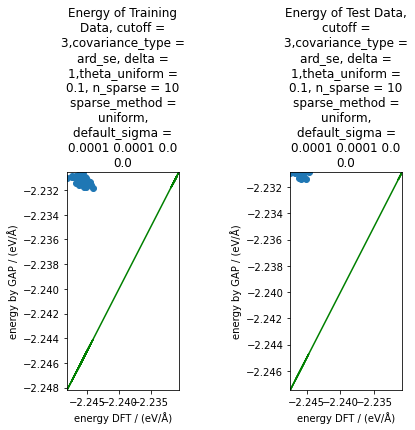

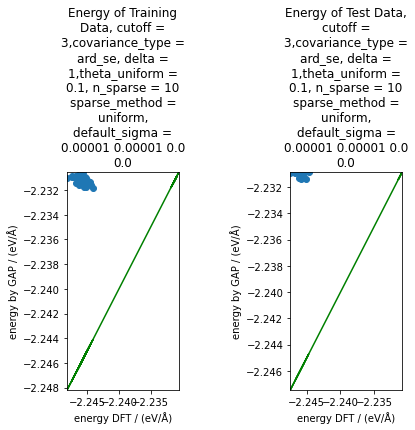

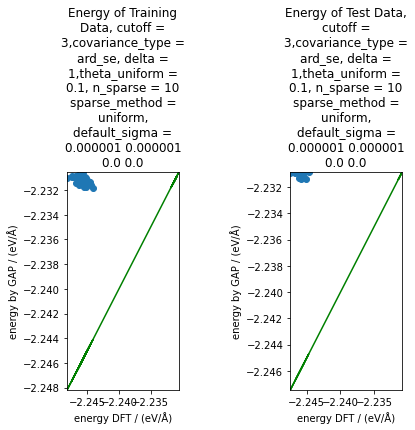

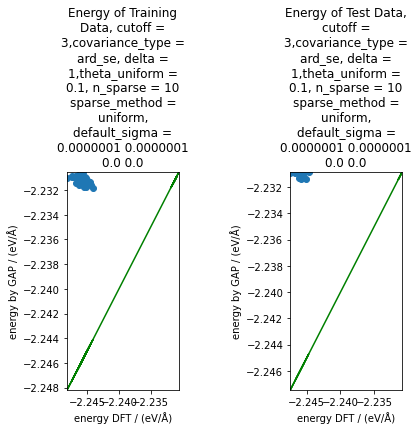

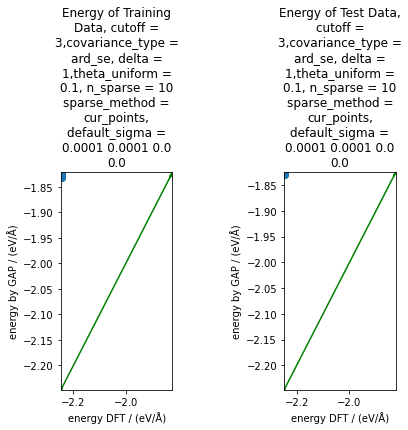

...

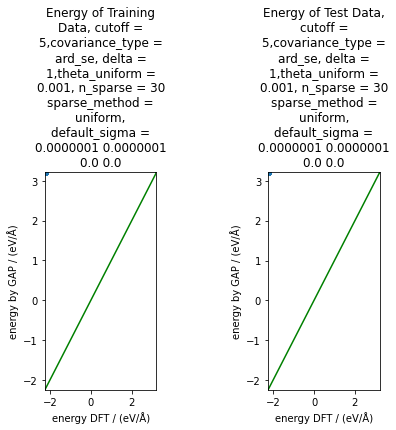

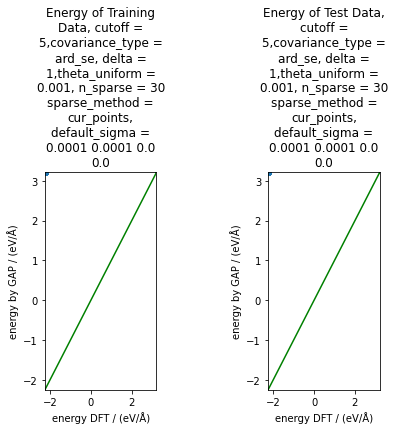

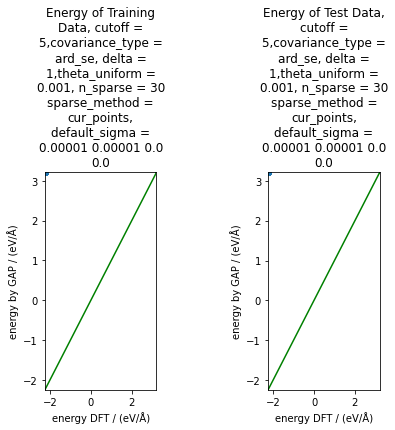

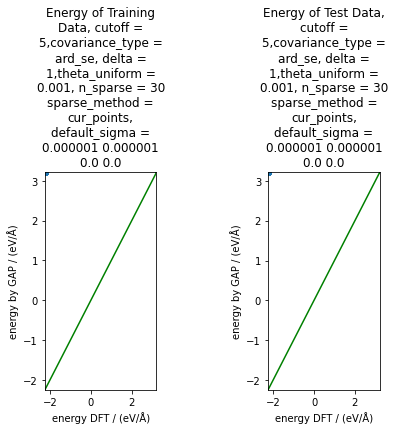

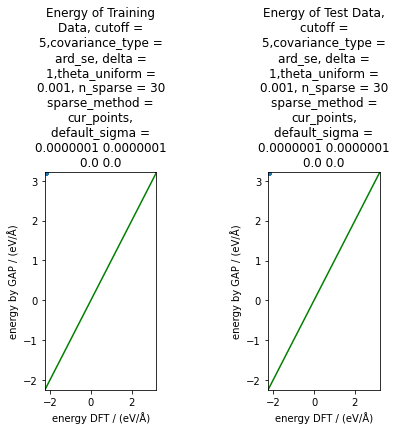

In [17]:
 for i,(cut,cov,delta,theta,nsparse,sparse,sigma) in enumerate(comb):
    # Plot ennergies to see quality of the fit
    plot = QualityPlot()
    
    # Make subplots object, returning axis object which is going to be passed to QualityPlot
    figs, axs = plt.subplots(nrows=1,ncols=2,gridspec_kw={'wspace':1,'hspace':1})
    
    # Plot predicted energies of training data against real energies of training data
    plot.energies_on_energies(real_values=train_file, predicted_values=f"quip_2b_train{i}.xyz", 
                            axis=axs[0],
                            title="\n".join(wrap(f"Energy of Training Data, cutoff = {cut},"
                            f"covariance_type = {cov}, delta = {delta},"
                            f"theta_uniform = {theta}, n_sparse = {nsparse} "
                            f"sparse_method = {sparse}, default_sigma = {sigma}",20)))
    
    # Plot predicted energies of test data against real energies of test data
    plot.energies_on_energies(real_values=test_file, predicted_values=f"quip_2b_test{i}.xyz", 
                            axis=axs[1], 
                            title="\n".join(wrap(f"Energy of Test Data, cutoff = {cut},"
                            f"covariance_type = {cov}, delta = {delta},"
                            f"theta_uniform = {theta}, n_sparse = {nsparse} "
                            f"sparse_method = {sparse}, default_sigma = {sigma}",20)))